In [1]:
''' This project is to predict whether a patient has ckd or not.'''

' This project is to predict whether a patient has ckd or not.'

In [2]:
%pip install pandas
%pip install seaborn
%pip install plotly
%pip install ydata_profiling
%pip install nbformat

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


# **Import Libraries**

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import confusion_matrix,accuracy_score

### Importing the Dataset

In [4]:
df = pd.read_csv('./chronickidneydisease.csv')
df

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,47,6700,4.9,no,no,no,good,no,no,notckd
396,396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,54,7800,6.2,no,no,no,good,no,no,notckd
397,397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,49,6600,5.4,no,no,no,good,no,no,notckd
398,398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,51,7200,5.9,no,no,no,good,no,no,notckd


In [5]:
df.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [6]:
df.tail()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
395,395,55.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,47,6700,4.9,no,no,no,good,no,no,notckd
396,396,42.0,70.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,54,7800,6.2,no,no,no,good,no,no,notckd
397,397,12.0,80.0,1.020,0.0,0.0,normal,normal,notpresent,notpresent,...,49,6600,5.4,no,no,no,good,no,no,notckd
398,398,17.0,60.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,51,7200,5.9,no,no,no,good,no,no,notckd
399,399,58.0,80.0,1.025,0.0,0.0,normal,normal,notpresent,notpresent,...,53,6800,6.1,no,no,no,good,no,no,notckd


In [7]:
### Run this to Profile data

import ydata_profiling as pp

profile = pp.ProfileReport(    df, title="Chronic Kidney Disease Profile", html={"style": {"full_width": True}}, sort=None)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 2 Data Cleaning

## a. Renaming the columns in the data to their expanded form

In [8]:
columns=pd.read_csv('./data_description.txt',sep='-')
columns=columns.reset_index()
columns.columns=['cols','abb_col_names']
df.columns=columns['abb_col_names'].values


## b. Correcting datatype of the columns

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       400 non-null    int64  
 1   age                      391 non-null    float64
 2   blood pressure           388 non-null    float64
 3   specific gravity         353 non-null    float64
 4   albumin                  354 non-null    float64
 5   sugar                    351 non-null    float64
 6   red blood cells          248 non-null    object 
 7   pus cell                 335 non-null    object 
 8   pus cell clumps          396 non-null    object 
 9   bacteria                 396 non-null    object 
 10  blood glucose random     356 non-null    float64
 11  blood urea               381 non-null    float64
 12  serum creatinine         383 non-null    float64
 13  sodium                   313 non-null    float64
 14  potassium                3

In [10]:
features=['red blood cell count','packed cell volume','white blood cell count']
def convert_dtype(df,feature):
    df[feature] = pd.to_numeric(df[feature], errors='coerce')
    
for feature in features:
    convert_dtype(df,feature)
    
df.dtypes

id                           int64
age                        float64
blood pressure             float64
specific gravity           float64
albumin                    float64
sugar                      float64
red blood cells             object
pus cell                    object
pus cell clumps             object
bacteria                    object
blood glucose random       float64
blood urea                 float64
serum creatinine           float64
sodium                     float64
potassium                  float64
haemoglobin                float64
packed cell volume         float64
white blood cell count     float64
red blood cell count       float64
hypertension                object
diabetes mellitus           object
coronary artery disease     object
appetite                    object
pedal edema                 object
anemia                      object
class                       object
dtype: object

## c. Drop the id column

In [11]:
df.drop(["id"],axis=1,inplace=True) 

## d. Cleaning Categorical Columns


In [12]:
cat_col=[col for col in df.columns if df[col].dtype=='object']
for col in cat_col:
    print('{} has {} values '.format(col,df[col].unique()))
    print('\n')

red blood cells has [nan 'normal' 'abnormal'] values 


pus cell has ['normal' 'abnormal' nan] values 


pus cell clumps has ['notpresent' 'present' nan] values 


bacteria has ['notpresent' 'present' nan] values 


hypertension has ['yes' 'no' nan] values 


diabetes mellitus has ['yes' 'no' ' yes' '\tno' '\tyes' nan] values 


coronary artery disease has ['no' 'yes' '\tno' nan] values 


appetite has ['good' 'poor' nan] values 


pedal edema has ['no' 'yes' nan] values 


anemia has ['no' 'yes' nan] values 


class has ['ckd' 'ckd\t' 'notckd'] values 




In [13]:
#Replace incorrect values

df['diabetes mellitus'].replace(to_replace = {'\tno':'no','\tyes':'yes',' yes':'yes'},inplace=True)

df['coronary artery disease'] = df['coronary artery disease'].replace(to_replace = '\tno', value='no')

df['class'] = df['class'].replace(to_replace = 'ckd\t', value = 'ckd')



for col in cat_col:
    print('{} has {} values  '.format(col, df[col].unique()))
    print('\n')

red blood cells has [nan 'normal' 'abnormal'] values  


pus cell has ['normal' 'abnormal' nan] values  


pus cell clumps has ['notpresent' 'present' nan] values  


bacteria has ['notpresent' 'present' nan] values  


hypertension has ['yes' 'no' nan] values  


diabetes mellitus has ['yes' 'no' nan] values  


coronary artery disease has ['no' 'yes' nan] values  


appetite has ['good' 'poor' nan] values  


pedal edema has ['no' 'yes' nan] values  


anemia has ['no' 'yes' nan] values  


class has ['ckd' 'notckd'] values  




## e. Assigning random values to missing(NaN) Values

In [14]:
data=df.copy()

### Categorical features using Random value Imputation & Mode imputation

In [15]:
data[cat_col].isnull().sum()

red blood cells            152
pus cell                    65
pus cell clumps              4
bacteria                     4
hypertension                 2
diabetes mellitus            2
coronary artery disease      2
appetite                     1
pedal edema                  1
anemia                       1
class                        0
dtype: int64

#### Random_value_imputation for "red blood cells" & "pus cell"


In [16]:
def Random_value_imputation(feature):
    random_sample=data[feature].dropna().sample(data[feature].isnull().sum())               
    random_sample.index=data[data[feature].isnull()].index
    data.loc[data[feature].isnull(),feature]=random_sample

Random_value_imputation('pus cell')
Random_value_imputation('red blood cells')
data[cat_col].isnull().sum()

red blood cells            0
pus cell                   0
pus cell clumps            4
bacteria                   4
hypertension               2
diabetes mellitus          2
coronary artery disease    2
appetite                   1
pedal edema                1
anemia                     1
class                      0
dtype: int64

#### mode_imputation for all other categorical features

In [17]:
def mode_imputation(feature):
    mode=data[feature].mode()[0]
    data[feature]=data[feature].fillna(mode)
    
for col in cat_col:
    mode_imputation(col)
    
data[cat_col].isnull().sum()

red blood cells            0
pus cell                   0
pus cell clumps            0
bacteria                   0
hypertension               0
diabetes mellitus          0
coronary artery disease    0
appetite                   0
pedal edema                0
anemia                     0
class                      0
dtype: int64

### Numerical features using Random value Imputation

In [18]:
num_col=[col for col in df.columns if df[col].dtype!='object']
data[num_col].isnull().sum()

age                         9
blood pressure             12
specific gravity           47
albumin                    46
sugar                      49
blood glucose random       44
blood urea                 19
serum creatinine           17
sodium                     87
potassium                  88
haemoglobin                52
packed cell volume         71
white blood cell count    106
red blood cell count      131
dtype: int64

In [19]:
for col in num_col:
    Random_value_imputation(col)
    
data[num_col].isnull().sum()

age                       0
blood pressure            0
specific gravity          0
albumin                   0
sugar                     0
blood glucose random      0
blood urea                0
serum creatinine          0
sodium                    0
potassium                 0
haemoglobin               0
packed cell volume        0
white blood cell count    0
red blood cell count      0
dtype: int64

# 3. Data Visualization

###  label distribution for Class data

In [20]:
sns.countplot(x='class',data=data)
plt.xlabel("class")
plt.ylabel("Count")
plt.title("target Class")
plt.show()
%matplotlib inline

###  Label distribution for Numerical data

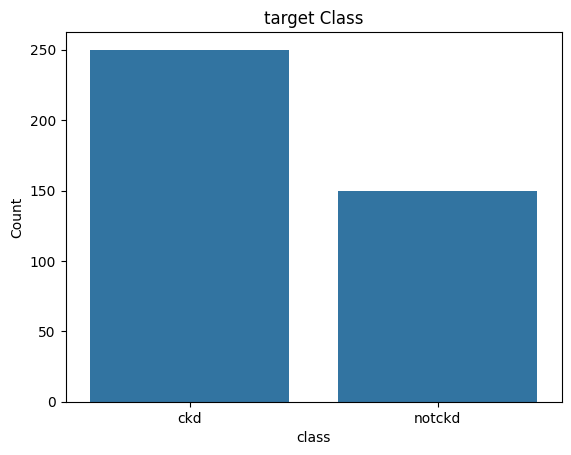

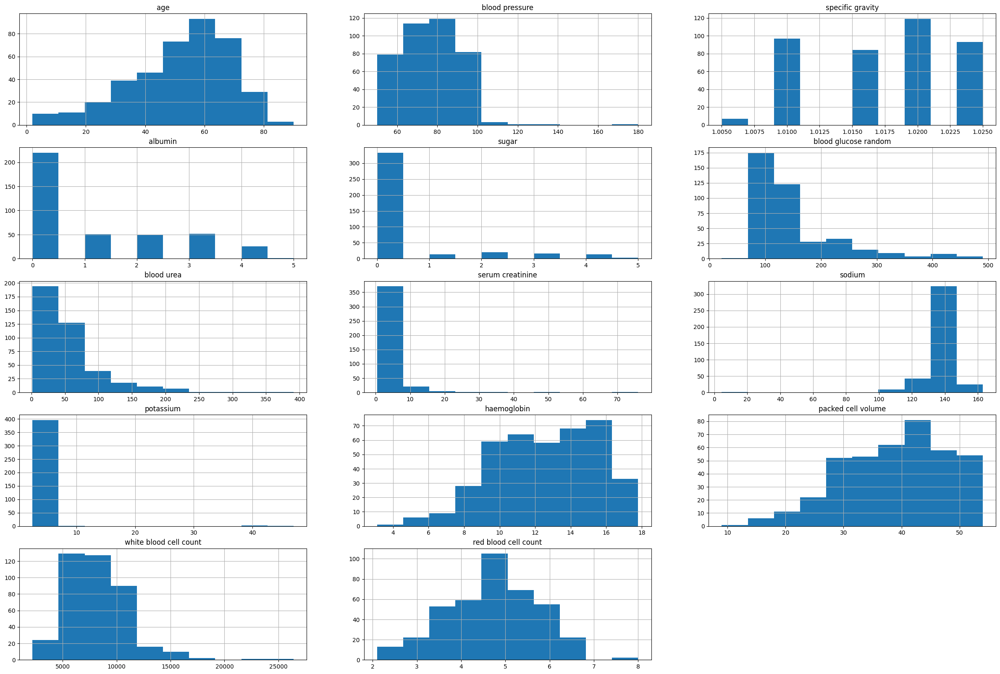

In [21]:
plt.figure(figsize=(30,20))
for i,feature in enumerate(num_col):
    plt.subplot(5,3,i+1)
    data[feature].hist()
    plt.title(feature)

    Observations:
        1.age looks a bit left skewed
        2.Blood gluscose random is right skewed
        3.Blood Urea is also a bit right skewed
        4.Rest of the features are lightly skewed

###  Label distribution for Categorical data

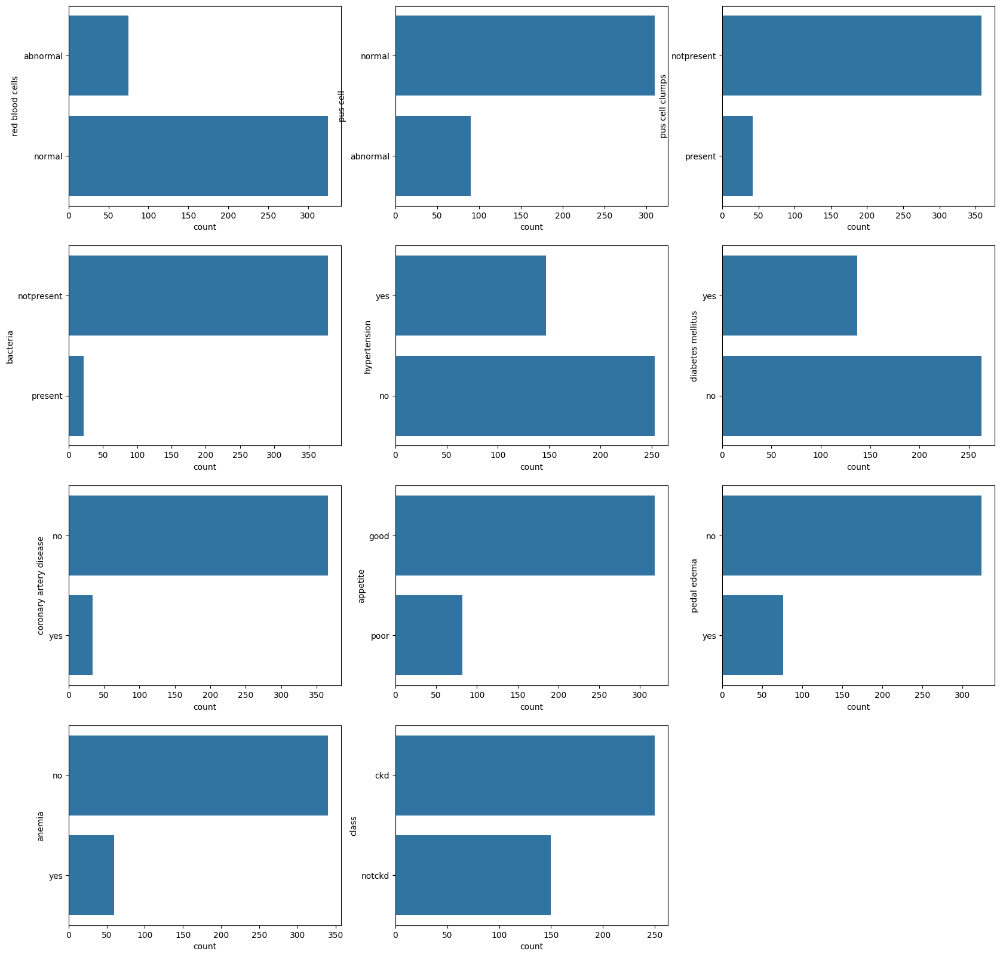

In [22]:
plt.figure(figsize=(20,20))
for i,feature in enumerate(cat_col):
    plt.subplot(4,3,i+1)
    sns.countplot(data[feature])
    

    A few features has imbalanced categories. Stratified folds will be necessary while cross validation.

### Correlations

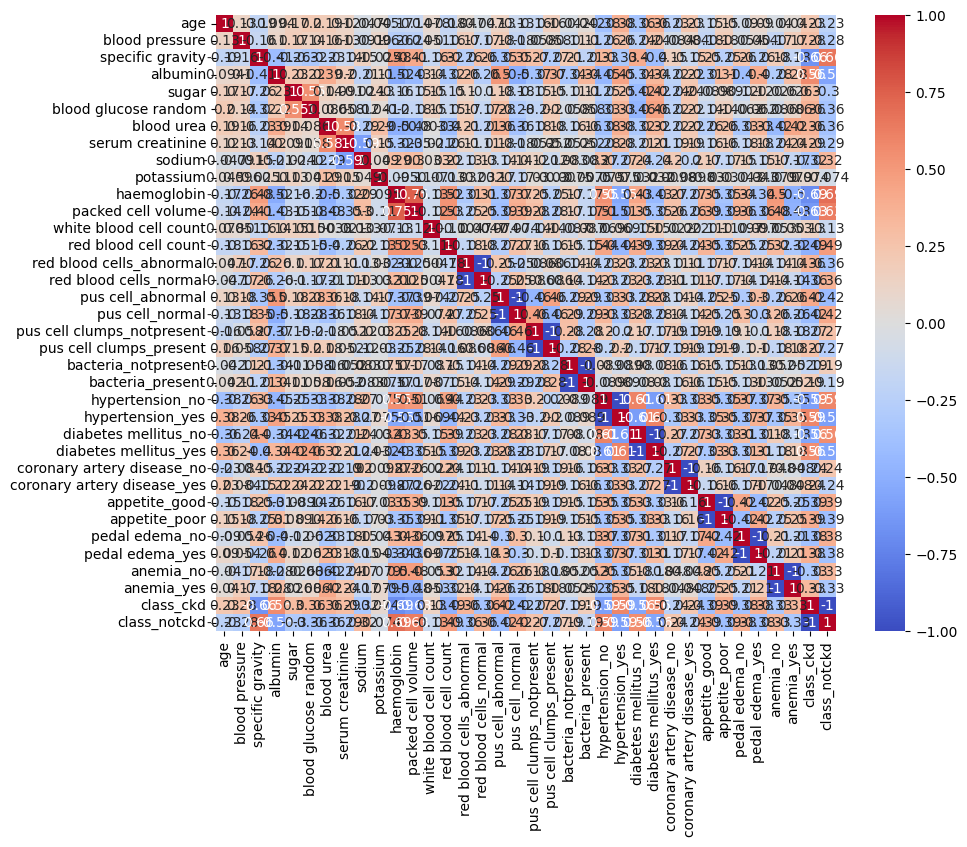

In [23]:
data_encoded = pd.get_dummies(data)

# Compute the correlation matrix
corr_df = data_encoded.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_df, annot=True, cmap='coolwarm')
plt.show()

    Positive Correlation:
    Specific gravity -> Red blood cell count, Packed cell volume and Hemoglobin
    Sugar -> Blood glucose random
    Blood Urea -> Serum creatinine
    Hemoglobin -> Red Blood cell count <- packed cell volume
    
    Negative Correlation:
    Albumin, Blood urea -> Red blood cell count, packed cell volume, Hemoglobin
    Serum creatinine -> Sodium

In [24]:
data.groupby(['red blood cells','class'])['red blood cell count'].agg(['count','mean','median','min','max'])

count      mean  median  min  max
red blood cells class                                    
abnormal        ckd        74  4.295946     4.3  2.1  6.4
                notckd      1  4.500000     4.5  4.5  4.5
normal          ckd       176  4.305682     4.2  2.1  8.0
                notckd    149  5.353691     5.3  3.4  6.5

### Let's check for Positive correlation and its impact on classes¶

In [25]:
%pip install nbformat

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
px.violin(data,y='red blood cell count',x="class", color="class")

In [27]:
px.scatter(df,'haemoglobin','packed cell volume')

### Analysing distribution of 'red_blood_cell_count' in both Labels 

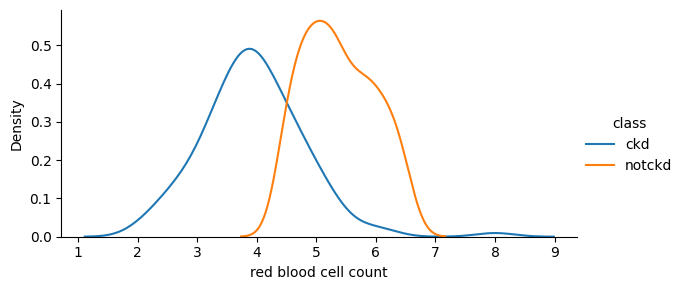

In [28]:
grid=sns.FacetGrid(df, hue="class",aspect=2)
grid.map(sns.kdeplot, 'red blood cell count')
grid.add_legend()

    Both distributions are quite different, distribution CKD is quite normal and evenly distributed but not CKD distribution is a little bit left-skewed but quite close to a normal distribution

### Defining violin and scatter plot & kde_plot functions

In [29]:
def violin(col):
    fig = px.violin(data, y=col, x="class", color="class", box=True)
    return fig.show()

def scatters(col1,col2):
    fig = px.scatter(data, x=col1, y=col2, color="class")
    return fig.show()

def kde_plot(feature):
    grid = sns.FacetGrid(data, hue="class",aspect=2)
    grid.map(sns.kdeplot, feature)
    grid.add_legend()

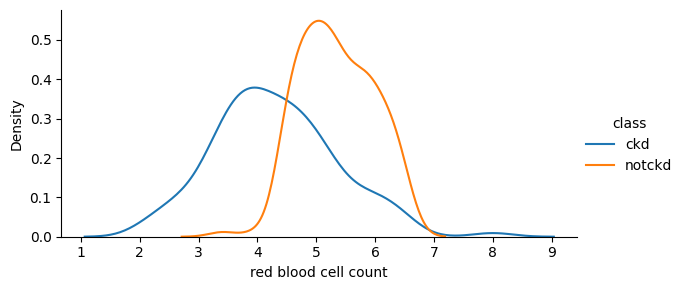

In [30]:
kde_plot('red blood cell count')

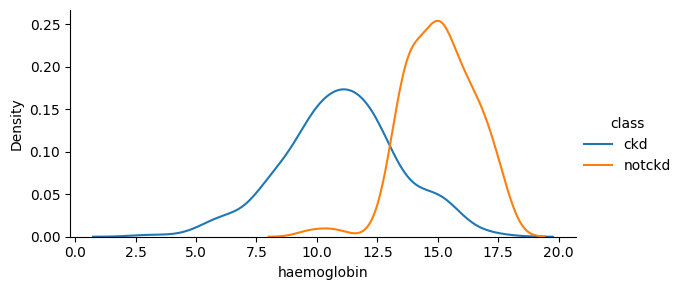

In [31]:
kde_plot('haemoglobin')

In [32]:
scatters('red blood cell count', 'packed cell volume')

In [33]:
scatters('red blood cell count', 'haemoglobin')

In [34]:
scatters('haemoglobin','packed cell volume')

    1.RBC count range ~2 to <4.5 and Hemoglobin between 3 to <13 are mostly classified as positive for chronic kidney  
    disease(i.e ckd).
    2.RBC count range >4.5 to ~6.1 and Hemoglobin between >13 to 17.8 are classified as negative for chronic kidney 
    disease(i.e nockd).

In [35]:
violin('red blood cell count')

In [36]:
violin('packed cell volume')

###  Now let's check for negative correlation and its impact on classes

    Albumin, Blood urea -> Red blood cell count, packed cell volume, Haemoglobin

In [37]:
scatters('red blood cell count','albumin')

    Clearly, albumin levels of above 0 affect ckd largely

In [38]:
scatters('packed cell volume','blood urea')

    Packed cell volume >= 40 largely affects to be non ckd

In [39]:
fig = px.bar(data, x="specific gravity", y="packed cell volume",
             color='class', barmode='group',
             height=400)
fig.show()

   

 Clearly, specific gravity >=1.02 affects non ckd

# 4. Feature Encoding / Label Encoder

In [40]:
for col in cat_col:
    print('{} categories in the column- {} '.format(data[col].nunique(), col))
    

2 categories in the column- red blood cells 
2 categories in the column- pus cell 
2 categories in the column- pus cell clumps 
2 categories in the column- bacteria 
2 categories in the column- hypertension 
2 categories in the column- diabetes mellitus 
2 categories in the column- coronary artery disease 
2 categories in the column- appetite 
2 categories in the column- pedal edema 
2 categories in the column- anemia 
2 categories in the column- class 


#### As we have just 2 categories in each feature then we can consider Label Encoder as it will not cause Curse of Dimensionality

In [41]:
from sklearn.preprocessing import LabelEncoder
le= LabelEncoder()
for col in cat_col:
    data[col]=le.fit_transform(data[col])
    
data.head()

,age,blood pressure,specific gravity,albumin,sugar,red blood cells,pus cell,pus cell clumps,bacteria,blood glucose random,...,packed cell volume,white blood cell count,red blood cell count,hypertension,diabetes mellitus,coronary artery disease,appetite,pedal edema,anemia,class
0,48.0,80.0,1.020,1.0,0.0,0,1,0,0,121.0,...,44.0,7800.0,5.2,1,1,0,0,0,0,0
1,7.0,50.0,1.020,4.0,0.0,1,1,0,0,120.0,...,38.0,6000.0,3.4,0,0,0,0,0,0,0
2,62.0,80.0,1.010,2.0,3.0,1,1,0,0,423.0,...,31.0,7500.0,4.3,0,1,0,1,0,1,0
3,48.0,70.0,1.005,4.0,0.0,1,0,1,0,117.0,...,32.0,6700.0,3.9,1,0,0,1,1,1,0
4,51.0,80.0,1.010,2.0,0.0,1,1,0,0,106.0,...,35.0,7300.0,4.6,0,0,0,0,0,0,0


# 5. Feature Selection

chi2-Internally this class is going to check that whether p-value is less than 0.05 or not based on that, it will order all the features

In [42]:
from sklearn.feature_selection import SelectKBest #Also known as Information Gain
from sklearn.feature_selection import chi2

ind_col=[col for col in data.columns if col!='class']
dep_col='class'

x=data[ind_col]
y=data[dep_col] 

ordered_rank_features=SelectKBest(score_func=chi2,k=20)
ordered_feature=ordered_rank_features.fit(x,y)

datascores=pd.DataFrame(ordered_feature.scores_,columns=["Score"])

dfcolumns=pd.DataFrame(x.columns)

features_rank=pd.concat([dfcolumns,datascores],axis=1)

features_rank.columns=['Features','Score']

# features_rank.nlargest(10,'Score')  --->  fetch largest 10 values of Score column   

selected_columns=features_rank.nlargest(10,'Score')['Features'].values
X_new=data[selected_columns]
X_new

,white blood cell count,blood urea,blood glucose random,serum creatinine,packed cell volume,albumin,haemoglobin,age,sugar,hypertension
0,7800.0,36.0,121.0,1.2,44.0,1.0,15.4,48.0,0.0,1
1,6000.0,18.0,120.0,0.8,38.0,4.0,11.3,7.0,0.0,0
2,7500.0,53.0,423.0,1.8,31.0,2.0,9.6,62.0,3.0,0
3,6700.0,56.0,117.0,3.8,32.0,4.0,11.2,48.0,0.0,1
4,7300.0,26.0,106.0,1.4,35.0,2.0,11.6,51.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
395,6700.0,49.0,140.0,0.5,47.0,0.0,15.7,55.0,0.0,0
396,7800.0,31.0,75.0,1.2,54.0,0.0,16.5,42.0,0.0,0
397,6600.0,26.0,100.0,0.6,49.0,0.0,15.8,12.0,0.0,0
398,7200.0,50.0,114.0,1.0,51.0,0.0,14.2,17.0,0.0,0


# 6. Model Building

## Random Forest Regression

In [43]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X_new, y, train_size=0.7, random_state=123)

model = RandomForestClassifier(random_state=123)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('Confusion matrix of Random Forest')
print(confusion_matrix(y_test, y_pred))
print("\n")

ac = accuracy_score(y_test, y_pred)
print('Accuracy score is', ac)
print("\n")

print("Classification Report for Random Forest:")
print(classification_report(y_test, y_pred))

Confusion matrix of Random Forest
[[76  2]
 [ 5 37]]


Accuracy score is 0.9416666666666667


Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96        78
           1       0.95      0.88      0.91        42

    accuracy                           0.94       120
   macro avg       0.94      0.93      0.93       120
weighted avg       0.94      0.94      0.94       120



## Logistic Regression

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X_new, y, train_size=0.7, random_state=123)

model = LogisticRegression(random_state=123)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('Confusion matrix of Logistic Regression')
print(confusion_matrix(y_test, y_pred))
print("\n")

ac = accuracy_score(y_test, y_pred)
print('Accuracy score is', ac)
print("\n")

print("Classification Report for Logistic Regression:")
print(classification_report(y_test, y_pred))

Confusion matrix of Logistic Regression
[[69  9]
 [ 4 38]]


Accuracy score is 0.8916666666666667


Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91        78
           1       0.81      0.90      0.85        42

    accuracy                           0.89       120
   macro avg       0.88      0.89      0.88       120
weighted avg       0.90      0.89      0.89       120



## Decision Tree

In [45]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X_new, y, train_size=0.7, random_state=123)

model = DecisionTreeClassifier(random_state=123)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Confusion Matrix for Decision Tree:")
print(confusion_matrix(y_test, y_pred))
print("\n")

ac = accuracy_score(y_test, y_pred)
print('Accuracy score is', ac)
print("\n")

print("Classification Report for Decision Tree:")
print(classification_report(y_test, y_pred))

Confusion Matrix for Decision Tree:
[[69  9]
 [ 4 38]]


Accuracy score is 0.8916666666666667


Classification Report for Decision Tree:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91        78
           1       0.81      0.90      0.85        42

    accuracy                           0.89       120
   macro avg       0.88      0.89      0.88       120
weighted avg       0.90      0.89      0.89       120



## KNN 

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(X_new, y, train_size=0.7, random_state=123)

model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)


print("Confusion Matrix for KNN:")
print(confusion_matrix(y_test, y_pred))
print("\n")

ac = accuracy_score(y_test, y_pred)
print('Accuracy score is', ac)
print("\n")

print("Classification Report for KNN:")
print(classification_report(y_test, y_pred))

Confusion Matrix for KNN:
[[38 40]
 [17 25]]


Accuracy score is 0.525


Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.69      0.49      0.57        78
           1       0.38      0.60      0.47        42

    accuracy                           0.53       120
   macro avg       0.54      0.54      0.52       120
weighted avg       0.58      0.53      0.53       120



Random Forest is chosen as the final model

In [47]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_new, y, train_size=0.7, random_state=123)

from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()


accuracy=[]

In [48]:

model.fit(X_train, y_train)
    
y_pred = model.predict(X_test)
print('Confusion matrix of Random Forest')
print(confusion_matrix(y_test, y_pred))
ac = accuracy_score(y_test, y_pred)
print('Accuracy score is ',ac)
accuracy.append(ac)
print('='*50)


Confusion matrix of Random Forest
[[76  2]
 [ 5 37]]
Accuracy score is  0.9416666666666667


In [49]:
# Assuming 'X_train' is your training data
num_features = X_train.shape[1]
print(f"Number of input features: {num_features}")
feature_names = X_train.columns.tolist()
print(f"Feature names: {feature_names}")
X_test.head()

Number of input features: 10
Feature names: ['white blood cell count', 'blood urea', 'blood glucose random', 'serum creatinine', 'packed cell volume', 'albumin', 'haemoglobin', 'age', 'sugar', 'hypertension']


,white blood cell count,blood urea,blood glucose random,serum creatinine,packed cell volume,albumin,haemoglobin,age,sugar,hypertension
234,4100.0,19.0,140.0,1.3,44.0,0.0,15.0,37.0,0.0,1
42,9200.0,29.0,204.0,1.0,33.0,0.0,9.7,47.0,0.0,1
303,6700.0,26.0,107.0,1.1,50.0,0.0,17.0,55.0,0.0,0
155,4700.0,40.0,123.0,1.8,36.0,3.0,11.1,50.0,0.0,0
342,7700.0,46.0,95.0,0.5,50.0,0.0,15.0,44.0,0.0,0


# 7. Tune Hyper parameters and Optimal values

### Random Forest Regression

In [50]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=123)

# Define the hyperparameters and their possible values for tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Evaluate the performance of the tuned model
f1_score = grid_search.score(X_test, y_test)

# Print results
print(f"Optimal Hyperparameters: {grid_search.best_params_}")
print(f"F1 Score on Test Set: {f1_score}")

Optimal Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
F1 Score on Test Set: 0.9135802469135802


### Logistic Regression


In [51]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

lr_classifier = LogisticRegression(random_state=123)

# Define the hyperparameters and their possible values for tuning
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 500]
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=lr_classifier, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

grid_search.fit(X_train, y_train)

# Evaluate the performance of the tuned model
f1_score = grid_search.score(X_test, y_test)

# Print results
print(f"Optimal Hyperparameters: {grid_search.best_params_}")
print(f"F1 Score on Test Set: {f1_score}")

Optimal Hyperparameters: {'C': 0.1, 'max_iter': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
F1 Score on Test Set: 0.9090909090909091


### Decision Tree Regression

In [52]:
# Decison Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt_classifier = DecisionTreeClassifier(random_state=123)

param_grid = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'criterion': ['gini', 'entropy']
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

grid_search.fit(X_train, y_train)

f1_score = grid_search.score(X_test, y_test)

# Print results
print(f"Optimal Hyperparameters: {grid_search.best_params_}")
print(f"F1 Score on Test Set: {f1_score}")

Optimal Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}
F1 Score on Test Set: 0.8571428571428571


### KNN 


In [53]:
#KNN 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn_classifier = KNeighborsClassifier()

# Define the hyperparameters and their possible values for tuning
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=knn_classifier, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

grid_search.fit(X_train, y_train)

# Evaluate the performance of the tuned model
f1_score = grid_search.score(X_test, y_test)

# Print results
print(f"Optimal Hyperparameters: {grid_search.best_params_}")
print(f"F1 Score on Test Set: {f1_score}")

Optimal Hyperparameters: {'algorithm': 'auto', 'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
F1 Score on Test Set: 0.46


# 8. Saving the model

In [54]:
import pickle
with open("model","wb") as file:
    pickle.dump(model,file)